# **SKKU AI (Spring 2023)**
### Lab 9: Some Practical Methodologies & Applications (In-class activity for Week 13)

**NOTE**
Some descriptions & codes from the below resources:
1. https://towardsdatascience.com/building-a-neural-network-with-a-single-hidden-layer-using-numpy-923be1180dbf
2. https://pytorch.org/tutorials/beginner/pytorch_with_examples.html
3.https://towardsdatascience.com/gradient-descent-show-me-the-math-7ba7d1caef09
4. https://peterroelants.github.io/posts/neural-network-implementation-part01/
5. https://colab.research.google.com/github/redcican/Master-Thesis/blob/master/11_Batch_Normalization_FashionMnist.ipynb#scrollTo=-hfQjQHRuEtC
6. https://pjreddie.com/darknet/yolo/
7. https://github.com/jo10010C/blog_yolo_v5
8. https://laid-back-scientist.com/en/yolo-v5

---

## 1. Quiz 2, Problem 2 (Backpropagation)

#### Forward Pass (without Neural Network)

In [ ]:
import numpy as np
import math

##############################################
# Forward Pass
##############################################
# Initialize inputs as ndarrays
bias = 5
x1 = 4
x2 = 2
inputs = np.array([[bias, x1, x2]]).T
print(inputs)
print(inputs.shape)

# Randomly initialize weights
# WH^T
WH_T = np.array([[0.5,0.3,0.2],[0.5,0.3,0.2], [0.5,0.3,0.2]]) 
# WO^T
WO_T = np.array([[0.3, 0.2, 0.1]])

print(WH_T)
print(WH_T.shape)
print(WO_T)
print(WO_T.shape)

# dot products
hidden = WH_T @ inputs
print(hidden)
print(hidden.shape)

y_pred =  WO_T @ hidden
print(y_pred)
print(y_pred.shape)

# Ground Truth Value = 1
y = 1

# Compute and print loss (the output error)
loss = (1/2) * np.square(y_pred - y).sum()
print(f'loss (the output error): loss = {loss}')

[[5]
 [4]
 [2]]
(3, 1)
[[0.5 0.3 0.2]
 [0.5 0.3 0.2]
 [0.5 0.3 0.2]]
(3, 3)
[[0.3 0.2 0.1]]
(1, 3)
[[4.1]
 [4.1]
 [4.1]]
(3, 1)
[[2.46]]
(1, 1)
loss (the output error): loss = 1.0658000000000005


#### Forward Pass (with Neural Network)

In [ ]:
import numpy as np
import math

##############################################
# Define Functions
##############################################

def parameters_initialization(input_unit, hidden_unit, output_unit):
    #W1 = np.random.randn(hidden_unit, input_unit)*0.01
    #WH_T
    W1 = np.array([[0.5,0.3,0.2],[0.5,0.3,0.2], [0.5,0.3,0.2]])
    #W2 = np.random.randn(output_unit, hidden_unit)*0.01
    #WO_T
    W2 = np.array([[0.3, 0.2, 0.1]])
    parameters = {"W1": W1,
                  "W2": W2
                 }
    
    return parameters

# Our network does not have activate functions
def forward_propagation(X, parameters):
    W1 = parameters['W1']
    W2 = parameters['W2']
    
    Z1 = np.dot(W1, X)
    Z2 = np.dot(W2, Z1)
    cache = {"Z1": Z1,"Z2": Z2}
    
    return Z2, cache

# Our cost function: MSE
def cost_function(Z2, Y):
    # number of training example
    #m = Y.shape[1]

    # just easy computation for gradient 
    m = 2

    # Compute MSE
    cost = np.square(Z2 - Y).sum() / m

    # Compute the cross-entropy cost
    #logprobs = np.multiply(np.log(A2), Y) + np.multiply((1-Y), np.log(1 - A2))
    #cost = - np.sum(logprobs) / m
    #cost = float(np.squeeze(cost))
                                    
    return cost

##############################################
# Forward Pass
##############################################

input_unit = 3
hidden_unit = 3
output_unit = 1

# We only have a single training sample
# Ground Truth Value = 1
Y = [1]

# X: Our Inputs
bias = 5
x1 = 4
x2 = 2
X = np.array([[bias, x1, x2]]).T
#print(X)

parameters = parameters_initialization(input_unit, hidden_unit, output_unit)

# Check our initial weights
#print(parameters)

Z2, cache = forward_propagation(X, parameters)
print(Z2, cache)

cost = cost_function(Z2, Y)
print(cost)

[[2.46]] {'Z1': array([[4.1],
       [4.1],
       [4.1]]), 'Z2': array([[2.46]])}
1.0658000000000005


#### Backward Pass (Backpropagation)

In [ ]:
import numpy as np
import math

##############################################
# Define Functions
##############################################

def parameters_initialization(input_unit, hidden_unit, output_unit):
    #W1 = np.random.randn(hidden_unit, input_unit)*0.01
    #WH_T
    W1 = np.array([[0.5,0.3,0.2],[0.5,0.3,0.2], [0.5,0.3,0.2]])
    #W2_test = np.random.randn(output_unit, hidden_unit)*0.01
    #print(W2_test)
    #WO_T
    W2 = np.array([[0.3, 0.2, 0.1]])
    parameters = {"W1": W1,
                  "W2": W2
                 }
    
    return parameters

# Our network does not have activate functions
def forward_propagation(X, parameters):
    W1 = parameters['W1']
    W2 = parameters['W2']
    
    Z1 = np.dot(W1, X)
    Z2 = np.dot(W2, Z1)
    cache = {"Z1": Z1,"Z2": Z2}
    
    return Z2, cache

# Our cost function: MSE
def cost_function(Z2, Y):
    # number of training example
    #m = Y.shape[1]

    # just easy computation for gradient 
    m = 2

    # Compute MSE
    cost = np.square(Z2 - Y).sum() / m

    # Compute the cross-entropy cost
    #logprobs = np.multiply(np.log(A2), Y) + np.multiply((1-Y), np.log(1 - A2))
    #cost = - np.sum(logprobs) / m
    #cost = float(np.squeeze(cost))
                                    
    return cost

def backward_propagation(parameters, cache, X, Y):

    #number of training example
    #m = X.shape[1]

    # We only have a single training sample
    m = 1
    
    W1 = parameters['W1']
    W2 = parameters['W2']
    Z1 = cache['Z1']
    Z2 = cache['Z2']
   
    #Calculate the error
    dZ2 = Z2 - Y
    print(dZ2)
    print(Z1)
    #Calculate change in weights for hidden layer to output layer
    dW2 = (1/m) * np.dot(dZ2, Z1.T)
    print(dW2)
    #dZ1 = np.multiply(np.dot(W2.T, dZ2), 1 - np.power(A1, 2))
    dZ1 = np.multiply(np.dot(W2.T, dZ2), 1)
    print(dZ1)
    #Calculate change in weights for input layer to hidden layer
    dW1 = (1/m) * np.dot(dZ1, X.T) 
    print(dW1)
    grads = {"dW1": dW1, "dW2": dW2}
    
    return grads

def gradient_descent(parameters, grads, learning_rate = 0.1):
    W1 = parameters['W1']
    W2 = parameters['W2']
   
    dW1 = grads['dW1']
    dW2 = grads['dW2']
    W1 = W1 - learning_rate * dW1
    W2 = W2 - learning_rate * dW2
    
    parameters = {"W1": W1, "W2": W2}
    
    return parameters

##############################################
# Forward Pass
##############################################

input_unit = 3
hidden_unit = 3
output_unit = 1

# We only have a single training sample
# Ground Truth Value = 1
Y = [1]

# X: Our Inputs
bias = 5
x1 = 4
x2 = 2
X = np.array([[bias, x1, x2]]).T
#print(X)

parameters = parameters_initialization(input_unit, hidden_unit, output_unit)

# Check our initial weights
#print(parameters)

Z2, cache = forward_propagation(X, parameters)
#print(Z2, cache)

cost = cost_function(Z2, Y)
#print(cost)

grads = backward_propagation(parameters, cache, X, Y)
print(grads)
parameters = gradient_descent(parameters, grads)
print(parameters)
print (f"Cost after the 1st iteration: {cost}")


[[1.46]]
[[4.1]
 [4.1]
 [4.1]]
[[5.986 5.986 5.986]]
[[0.438]
 [0.292]
 [0.146]]
[[2.19  1.752 0.876]
 [1.46  1.168 0.584]
 [0.73  0.584 0.292]]
{'dW1': array([[2.19 , 1.752, 0.876],
       [1.46 , 1.168, 0.584],
       [0.73 , 0.584, 0.292]]), 'dW2': array([[5.986, 5.986, 5.986]])}
{'W1': array([[0.281 , 0.1248, 0.1124],
       [0.354 , 0.1832, 0.1416],
       [0.427 , 0.2416, 0.1708]]), 'W2': array([[-0.2986, -0.3986, -0.4986]])}
Cost after the 1st iteration: 1.0658000000000005


In [ ]:
import numpy as np
import math

##############################################
# Define Functions
##############################################

def parameters_initialization(input_unit, hidden_unit, output_unit):
    #W1 = np.random.randn(hidden_unit, input_unit)*0.01
    #WH_T
    W1 = np.array([[0.5,0.3,0.2],[0.5,0.3,0.2], [0.5,0.3,0.2]])
    #W2_test = np.random.randn(output_unit, hidden_unit)*0.01
    #print(W2_test)
    #WO_T
    W2 = np.array([[0.3, 0.2, 0.1]])
    parameters = {"W1": W1,
                  "W2": W2
                 }
    
    return parameters

# Our network does not have activate functions
def forward_propagation(X, parameters):
    W1 = parameters['W1']
    W2 = parameters['W2']
    
    Z1 = np.dot(W1, X)
    Z2 = np.dot(W2, Z1)
    cache = {"Z1": Z1,"Z2": Z2}
    
    return Z2, cache

# Our cost function: MSE
def cost_function(Z2, Y):
    # number of training example
    #m = Y.shape[1]

    # just easy computation for gradient 
    m = 2

    # Compute MSE
    cost = np.square(Z2 - Y).sum() / m

    # Compute the cross-entropy cost
    #logprobs = np.multiply(np.log(A2), Y) + np.multiply((1-Y), np.log(1 - A2))
    #cost = - np.sum(logprobs) / m
    #cost = float(np.squeeze(cost))
                                    
    return cost

def backward_propagation(parameters, cache, X, Y):

    #number of training example
    #m = X.shape[1]

    # We only have a single training sample
    m = 1
    
    W1 = parameters['W1']
    W2 = parameters['W2']
    Z1 = cache['Z1']
    Z2 = cache['Z2']
   
    #Calculate the error
    dZ2 = Z2 - Y
    #Calculate change in weights for hidden layer to output layer
    dW2 = (1/m) * np.dot(dZ2, Z1.T)
    #dZ1 = np.multiply(np.dot(W2.T, dZ2), 1 - np.power(A1, 2))
    dZ1 = np.multiply(np.dot(W2.T, dZ2), 1)
    #Calculate change in weights for input layer to hidden layer
    dW1 = (1/m) * np.dot(dZ1, X.T) 
    grads = {"dW1": dW1, "dW2": dW2}
    
    return grads

def gradient_descent(parameters, grads, learning_rate = 0.1):
    W1 = parameters['W1']
    W2 = parameters['W2']
   
    dW1 = grads['dW1']
    dW2 = grads['dW2']
    W1 = W1 - learning_rate * dW1
    W2 = W2 - learning_rate * dW2
    
    parameters = {"W1": W1, "W2": W2}
    
    return parameters

##############################################
# Forward Pass
##############################################

input_unit = 3
hidden_unit = 3
output_unit = 1

# We only have a single training sample
# Ground Truth Value = 1
Y = [1]

# X: Our Inputs
bias = 5
x1 = 4
x2 = 2
X = np.array([[bias, x1, x2]]).T
#print(X)

parameters = parameters_initialization(input_unit, hidden_unit, output_unit)

# 10 iterations wih lr = 0.01
num_iterations = 10
lr = 0.01
for i in range(0, num_iterations):
  Z2, cache = forward_propagation(X, parameters)
  cost = cost_function(Z2, Y)
  grads = backward_propagation(parameters, cache, X, Y)
  parameters = gradient_descent(parameters, grads, lr)
  
  if i % 1 == 0:
    print (f"Cost after iteration {i}: {cost}")

Cost after iteration 0: 1.0658000000000005
Cost after iteration 1: 0.21473447925678546
Cost after iteration 2: 0.05299627446769534
Cost after iteration 3: 0.013914031587804292
Cost after iteration 4: 0.003745907244628937
Cost after iteration 5: 0.0010201240043194967
Cost after iteration 6: 0.00027937366100981977
Cost after iteration 7: 7.672702350732239e-05
Cost after iteration 8: 2.110298877258375e-05
Cost after iteration 9: 5.808555157984558e-06


## 2. Comparison of Batch Normalization Using FashionMNIST


### 2.1. Introduction to the Dataset (Fashion-MNIST)

Fashion-MNIST is a dataset of Zalando's article images—consisting of a training set of 60,000 examples and a test set of 10,000 examples. Each example is a 28x28 grayscale image, associated with a label from 10 classes

Labels:

*   0 : T-shirt/top
*   1 : Trouser
*   2 : Pullover
*   3 : Dress
*   4 : Coat
*   5 : Sandal
*   6 : Shirt
*   7 : Sneake
*   8 : Bag
*   9 : Ankle Boot

### 2.2. Data Preprocessing

In [ ]:
from tensorflow.keras.utils import to_categorical
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

In [ ]:
from keras.datasets import fashion_mnist
(X_train,Y_train),(X_test,Y_test) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 0s 0us/step


In [ ]:
num_classes = 10
img_rows, img_cols = 28, 28
epochs = 100
batch_size = 256
input_shape = (img_rows, img_cols, 1)
X_train = X_train.reshape(X_train.shape[0], img_rows, img_cols, 1)
X_test = X_test.reshape(X_test.shape[0], img_rows, img_cols, 1)
Y_train = to_categorical(Y_train,num_classes)
Y_test = to_categorical(Y_test, num_classes)

In [ ]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_test /= 255
X_train.shape, X_test.shape,Y_train.shape, Y_test.shape

((60000, 28, 28, 1), (10000, 28, 28, 1), (60000, 10), (10000, 10))

### 2.3. Building the Neural Network

In [ ]:
import time
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf 
import keras
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Activation
from keras.layers import Conv2D, MaxPooling2D
from keras import optimizers

# For Batch Normalization
from tensorflow.keras.layers import BatchNormalization

#### 2.3.1. without Batch Normalization

In [ ]:
model_1 = Sequential()

model_1.add(Conv2D(32, kernel_size=(3,3),input_shape=input_shape,use_bias=True))
model_1.add(Activation('relu'))
model_1.add(MaxPooling2D(2,2))
model_1.add(Dropout(0.25))

model_1.add(Conv2D(64, (3,3),use_bias=True))
model_1.add(Activation('relu'))
model_1.add(MaxPooling2D(pool_size=(2,2)))
model_1.add(Dropout(0.25))

model_1.add(Conv2D(128,(3,3),use_bias=True))
model_1.add(Activation('relu'))
model_1.add(Dropout(0.4))

model_1.add(Flatten())
model_1.add(Dense(128,use_bias=True))
model_1.add(Activation('relu'))
model_1.add(Dropout(0.3))
model_1.add(Dense(num_classes,activation='softmax'))
  
model_1.compile(loss='categorical_crossentropy',
               optimizer=tf.optimizers.Adam(learning_rate=0.01),metrics=['accuracy'])

In [ ]:
start = time.time()
model_1_history = model_1.fit(X_train, Y_train,
                             batch_size = batch_size,
                             epochs = epochs,
                             verbose = 2,
                             validation_data = (X_test, Y_test))
print('@ Total Time Spent: %.2f seconds' %(time.time()-start))

Epoch 1/100
235/235 - 13s - loss: 0.7194 - accuracy: 0.7276 - val_loss: 0.4689 - val_accuracy: 0.8189 - 13s/epoch - 55ms/step
Epoch 2/100
235/235 - 2s - loss: 0.5137 - accuracy: 0.8065 - val_loss: 0.4151 - val_accuracy: 0.8423 - 2s/epoch - 9ms/step
Epoch 3/100
235/235 - 2s - loss: 0.4885 - accuracy: 0.8193 - val_loss: 0.4043 - val_accuracy: 0.8447 - 2s/epoch - 7ms/step
Epoch 4/100
235/235 - 2s - loss: 0.4721 - accuracy: 0.8268 - val_loss: 0.4257 - val_accuracy: 0.8315 - 2s/epoch - 7ms/step
Epoch 5/100
235/235 - 2s - loss: 0.4724 - accuracy: 0.8252 - val_loss: 0.4045 - val_accuracy: 0.8427 - 2s/epoch - 7ms/step
Epoch 6/100
235/235 - 2s - loss: 0.4596 - accuracy: 0.8286 - val_loss: 0.4122 - val_accuracy: 0.8450 - 2s/epoch - 7ms/step
Epoch 7/100
235/235 - 2s - loss: 0.4524 - accuracy: 0.8343 - val_loss: 0.3784 - val_accuracy: 0.8555 - 2s/epoch - 7ms/step
Epoch 8/100
235/235 - 2s - loss: 0.4611 - accuracy: 0.8289 - val_loss: 0.4168 - val_accuracy: 0.8376 - 2s/epoch - 8ms/step
Epoch 9/100
2

In [ ]:
train_loss_1, train_accuracy_1 = model_1.evaluate(X_train, Y_train, verbose=0)
print("Training Accuracy = %.2f %%     loss = %f" % (train_accuracy_1 * 100, train_loss_1))
test_loss_1, test_accuracy_1 = model_1.evaluate(X_test, Y_test, verbose=0)
print("Testing Accuracy = %.2f %%    loss = %f" % (test_accuracy_1 * 100, test_loss_1))

Training Accuracy = 88.04 %     loss = 0.307081
Testing Accuracy = 86.86 %    loss = 0.361752


#### 2.3.2. with Batch Normalization

In [ ]:
model_2 = Sequential()

model_2.add(Conv2D(32, kernel_size=(3,3),input_shape=input_shape,use_bias=True))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(2,2))
model_2.add(Dropout(0.25))

model_2.add(Conv2D(64, (3,3),use_bias=True))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size=(2,2)))
model_2.add(Dropout(0.25))

model_2.add(Conv2D(128,(3,3),use_bias=True))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(Dropout(0.4))

model_2.add(Flatten())
model_2.add(Dense(128,use_bias=True))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(Dropout(0.3))
model_2.add(Dense(num_classes,activation='softmax'))
  
model_2.compile(loss='categorical_crossentropy',
               optimizer=tf.optimizers.Adam(learning_rate=0.01),metrics=['accuracy'])

In [ ]:
start = time.time()
model_2_history = model_2.fit(X_train, Y_train,
                             batch_size = batch_size,
                             epochs = epochs,
                             verbose = 2,
                             validation_data = (X_test, Y_test))
print('@ Total Time Spent: %.2f seconds' %(time.time()-start))

Epoch 1/100
235/235 - 7s - loss: 0.5290 - accuracy: 0.8053 - val_loss: 2.4517 - val_accuracy: 0.4047 - 7s/epoch - 32ms/step
Epoch 2/100
235/235 - 3s - loss: 0.3785 - accuracy: 0.8607 - val_loss: 0.4335 - val_accuracy: 0.8382 - 3s/epoch - 11ms/step
Epoch 3/100
235/235 - 3s - loss: 0.3415 - accuracy: 0.8748 - val_loss: 0.3570 - val_accuracy: 0.8604 - 3s/epoch - 11ms/step
Epoch 4/100
235/235 - 3s - loss: 0.3202 - accuracy: 0.8834 - val_loss: 0.3274 - val_accuracy: 0.8739 - 3s/epoch - 12ms/step
Epoch 5/100
235/235 - 3s - loss: 0.3100 - accuracy: 0.8855 - val_loss: 0.3064 - val_accuracy: 0.8900 - 3s/epoch - 13ms/step
Epoch 6/100
235/235 - 3s - loss: 0.2938 - accuracy: 0.8924 - val_loss: 0.3003 - val_accuracy: 0.8863 - 3s/epoch - 12ms/step
Epoch 7/100
235/235 - 3s - loss: 0.2830 - accuracy: 0.8958 - val_loss: 0.2781 - val_accuracy: 0.9017 - 3s/epoch - 11ms/step
Epoch 8/100
235/235 - 3s - loss: 0.2779 - accuracy: 0.8973 - val_loss: 0.2765 - val_accuracy: 0.8986 - 3s/epoch - 11ms/step
Epoch 9/

In [ ]:
train_loss_2, train_accuracy_2 = model_2.evaluate(X_train, Y_train, verbose=0)
print("Training Accuracy = %.2f %%     loss = %f" % (train_accuracy_2 * 100, train_loss_2))
test_loss_2, test_accuracy_2 = model_2.evaluate(X_test, Y_test, verbose=0)
print("Testing Accuracy = %.2f %%    loss = %f" % (test_accuracy_2 * 100, test_loss_2))

Training Accuracy = 96.89 %     loss = 0.082935
Testing Accuracy = 92.80 %    loss = 0.218881


### Plot the Result and Compare the two models!

<ipython-input-16-1391910ee5d1>:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


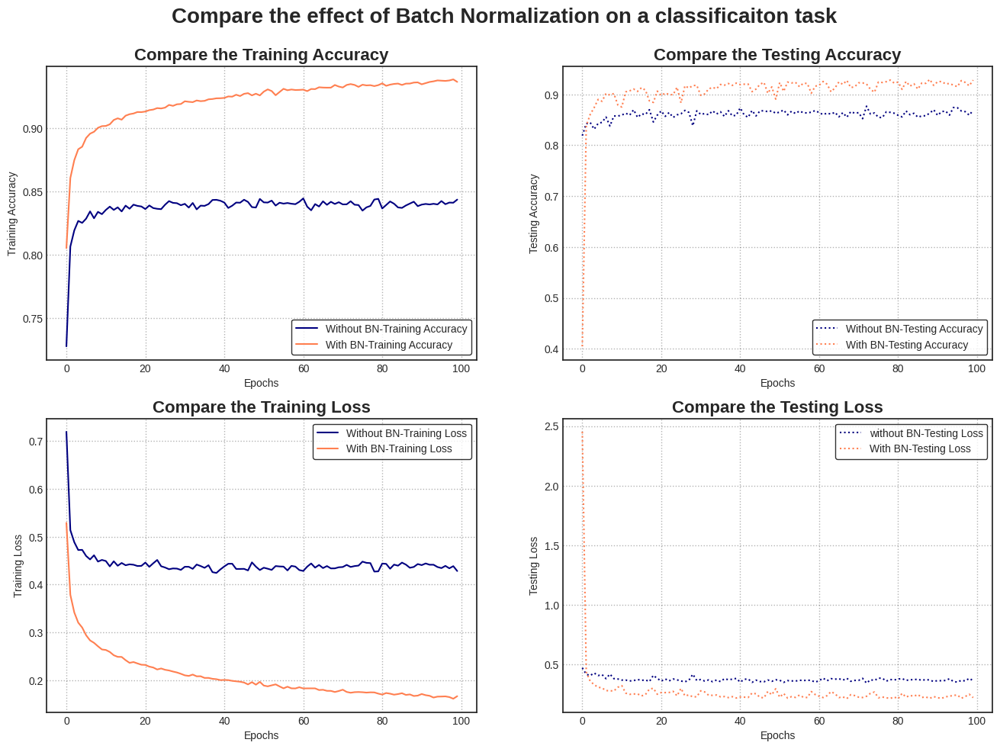

In [ ]:
plt.style.use('seaborn-white')
fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize=(16,11))
ax1.plot(model_1_history.history['accuracy'],color='navy',label='Without BN-Training Accuracy')
ax1.plot(model_2_history.history['accuracy'],color='coral',label='With BN-Training Accuracy')
ax1.legend(frameon=True,edgecolor='black')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Training Accuracy')
ax1.grid(True,color='black',linestyle='dotted',linewidth=1,alpha=.3)
ax1.set_title('Compare the Training Accuracy',fontsize=16, fontweight='bold')

ax2.plot(model_1_history.history['val_accuracy'],color='navy',linestyle=':',label='Without BN-Testing Accuracy')
ax2.plot(model_2_history.history['val_accuracy'],color='coral',linestyle=':',label='With BN-Testing Accuracy')
ax2.legend(frameon=True,edgecolor='black')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Testing Accuracy')
ax2.grid(True,color='black',linestyle='dotted',linewidth=1,alpha=.3)
ax2.set_title('Compare the Testing Accuracy',fontsize=16, fontweight='bold')

ax3.plot(model_1_history.history['loss'],color='navy',label='Without BN-Training Loss')
ax3.plot(model_2_history.history['loss'],color='coral',label='With BN-Training Loss')
ax3.legend(frameon=True,edgecolor='black')
ax3.set_xlabel('Epochs')
ax3.set_ylabel('Training Loss')
ax3.grid(True,color='black',linestyle='dotted',linewidth=1,alpha=.3)
ax3.set_title('Compare the Training Loss',fontsize=16, fontweight='bold')

ax4.plot(model_1_history.history['val_loss'],color='navy',linestyle=':',label='without BN-Testing Loss')
ax4.plot(model_2_history.history['val_loss'],color='coral',linestyle=':',label='With BN-Testing Loss')
ax4.legend(frameon=True,edgecolor='black')
ax4.set_xlabel('Epochs')
ax4.set_ylabel('Testing Loss')
ax4.grid(True,color='black',linestyle='dotted',linewidth=1,alpha=.3)
ax4.set_title('Compare the Testing Loss',fontsize=16, fontweight='bold')

fig.suptitle('Compare the effect of Batch Normalization on a classificaiton task',fontsize=20, fontweight='bold',y=0.95)
plt.show()

## 3. Object Detection using YOLO v5

https://pjreddie.com/darknet/yolo/


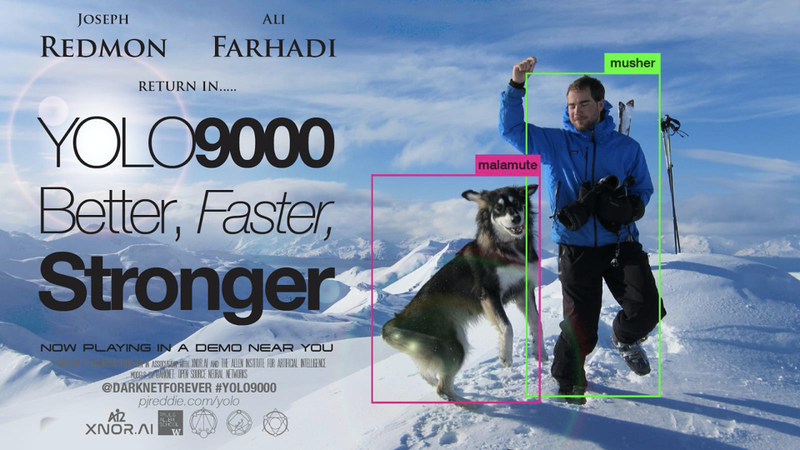

In [1]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15705, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 15705 (delta 9), reused 19 (delta 4), pack-reused 15672
Receiving objects: 100% (15705/15705), 14.50 MiB | 24.42 MiB/s, done.
Resolving deltas: 100% (10754/10754), done.


#### For small penguin dataset

https://github.com/jo10010C/blog_yolo_v5

In [2]:
!git clone https://github.com/jo10010C/blog_yolo_v5.git

Cloning into 'blog_yolo_v5'...
remote: Enumerating objects: 111, done.
remote: Counting objects: 100% (111/111), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 111 (delta 14), reused 104 (delta 7), pack-reused 0
Receiving objects: 100% (111/111), 2.32 MiB | 22.37 MiB/s, done.
Resolving deltas: 100% (14/14), done.


In [3]:
%cd /content/yolov5/
!pip install -qr requirements.txt

/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.4/589.4 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.5/206.5 kB 11.7 MB/s eta 0:00:00


In [4]:
import os
from PIL import Image

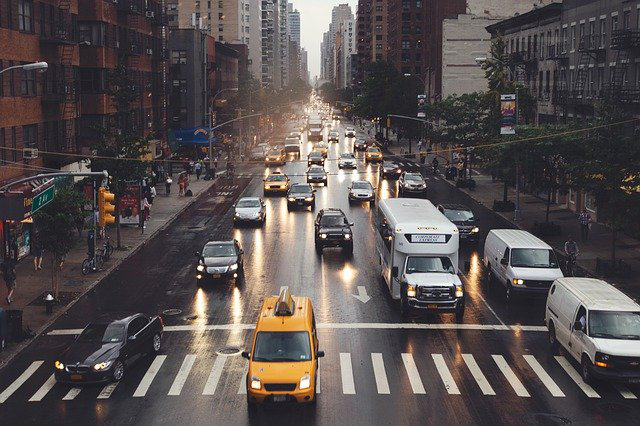

In [5]:
dir_path = '/content/blog_yolo_v5'
target_img_name = 'car-g66d23a21d_640.jpg'
target_img_path = os.path.join(dir_path, target_img_name)

img = Image.open(target_img_path)
display(img)

detect: weights=['yolov5s.pt'], source=/content/blog_yolo_v5/car-g66d23a21d_640.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=demo, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

100% 14.1M/14.1M [00:00<00:00, 338MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/1 /content/blog_yolo_v5/car-g66d23a21d_640.jpg: 448x640 2 persons, 2 bicycles, 17 cars, 1 truck, 1 traffic light, 43.4ms
Speed: 0.5ms pre-process, 43.4ms inference, 39.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/demo


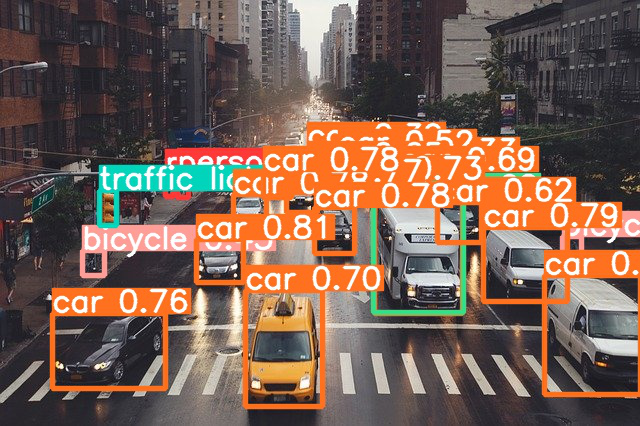

In [6]:
!python detect.py --source {target_img_path} --weights yolov5s.pt --conf 0.3 --name demo --exist-ok

saved_dir = '/content/yolov5/runs/detect/demo'

img = Image.open(os.path.join(saved_dir, target_img_name))
display(img)

detect: weights=['yolov5s.pt'], source=/content/blog_yolo_v5/penguins/test/penguin-g1a89df9cc_640.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=untrained_exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/1 /content/blog_yolo_v5/penguins/test/penguin-g1a89df9cc_640.jpg: 448x640 2 birds, 41.8ms
Speed: 0.5ms pre-process, 41.8ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/untrained_exp


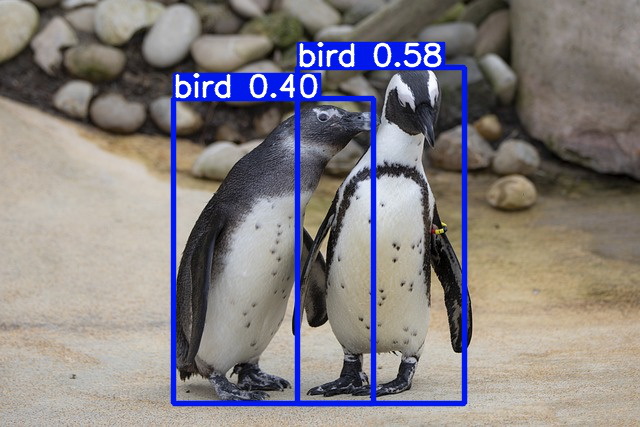

In [7]:
dir_path = '/content/blog_yolo_v5/penguins/test'
target_img_name = 'penguin-g1a89df9cc_640.jpg'
target_img_path = os.path.join(dir_path, target_img_name)

!python detect.py --source {target_img_path} --weights yolov5s.pt --conf 0.25 --name untrained_exp --exist-ok

saved_dir = '/content/yolov5/runs/detect/untrained_exp'
img = Image.open(os.path.join(saved_dir, target_img_name))
display(img)

In [8]:
yaml_path = '/content/blog_yolo_v5/penguins/penguin.yaml'

!python train.py --img 640 --batch 16 --epochs 20 --data {yaml_path} --weights yolov5s.pt

train: weights=yolov5s.pt, cfg=, data=/content/blog_yolo_v5/penguins/penguin.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/blog_yolo_v5/penguins/test/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=trained_exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/3 /content/blog_yolo_v5/penguins/test/bird-g34dc23889_640.jpg: 640x448 (no detections), 40.3ms
image 2/3 /content/blog_yolo_v5/penguins/test/penguin-g1a89df9cc_640.jpg: 448x640 (no detections), 39.7ms
image 3/3 /content/blog_yolo_v5/penguins/test/penguin-g44e392097_640.jpg: 640x576 (no detections),

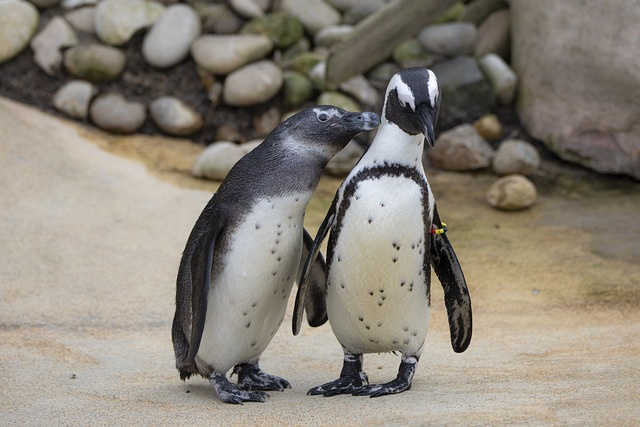

In [9]:
best_param_path = '/content/yolov5/runs/train/exp/weights/best.pt'
test_datas_dir = '/content/blog_yolo_v5/penguins/test/'

!python detect.py --source {test_datas_dir} --weights {best_param_path} --conf 0.25 --name trained_exp --exist-ok --save-conf

saved_dir = '/content/yolov5/runs/detect/trained_exp'
img = Image.open(os.path.join(saved_dir, target_img_name))
display(img)

In [ ]:
from google.colab import files

uploaded = files.upload()

In [ ]:
target_img_name = 'real_penguin_01.jpg'
!python detect.py --source {target_img_name} --weights {best_param_path} --conf 0.25 --name trained_exp --exist-ok --save-conf

saved_dir = '/content/yolov5/runs/detect/trained_exp'
img = Image.open(os.path.join(saved_dir, target_img_name))
display(img)

In [ ]:
target_img_name = 'real_penguin_02.jpg'
!python detect.py --source {target_img_name} --weights {best_param_path} --conf 0.25 --name trained_exp --exist-ok --save-conf

saved_dir = '/content/yolov5/runs/detect/trained_exp'
img = Image.open(os.path.join(saved_dir, target_img_name))
display(img)

---
## (Simple & Easy!) Lab activity 9

### Write your object detection code to detect a specific kind of object. You can use the well-known object detection model like YOLO.